# <strong>第四次作品更正：CNN PART2 - 高解析度影像生成的訓練 SRCNN</strong>
學號：711233117

姓名：楊廷紳

 <font color=skyblue>作品目標</font>：
 
- 更正程式碼流程
- 最後一小題對於圖片放大的理解也有更正
 <hr>

In [1]:
!python patchify_image.py

Creating patches for 91 images



100%|██████████| 91/91 [00:25<00:00,  3.56it/s]


In [2]:
!python bicubic.py --path ../input/Set14/original ../input/Set5/original --scale-factor 3x

19
Scaling factor: 3x
Low resolution images save path: ../input/test_bicubic_rgb_3x
Original image dimensions: 500, 480
Original image dimensions: 720, 576
Original image dimensions: 512, 512
Original image dimensions: 352, 288
Original image dimensions: 250, 361
Original image dimensions: 276, 276
Original image dimensions: 500, 362
Original image dimensions: 352, 288
Original image dimensions: 512, 512
Original image dimensions: 512, 512
Original image dimensions: 768, 512
Original image dimensions: 512, 512
Original image dimensions: 529, 656
Original image dimensions: 586, 391
Original image dimensions: 512, 512
Original image dimensions: 288, 288
Original image dimensions: 256, 256
Original image dimensions: 280, 280
Original image dimensions: 228, 344


In [3]:
!python datasets.py

utils.py 檔都為 def 函式可以不用執行 記得呼叫即可

In [4]:
#!python utils.py 

<hr>

經過更正的流程應該是 
1. 讀入建立好的模型 (ex:model.pth)
2. 訓練多次 (500次) 存出去，train,py 會自動更新 checkpoint 狀態 (ex:model_ckpt.pth) 
3. 再讀入 checkpoint 訓練 2 次

由於訓練過 model.pth 過 ， 所以先不執行該命令

In [ ]:
#2. 自行設定要的次數
#!python train.py --epochs 500 

In [5]:
#3.再讀入 checkpoint 訓練 2 次
!python train.py --epochs 2 --weights ../outputs/model_ckpt.pth

#一定要有 -w 不然不會有 checkpoint
#可以設定 train.py 每多少 epochs 存一次 checkpoint
#help='weights/checkpoint path to resume training'

Computation device:  cuda
Loading weights to resume training...
SRCNN(
  (conv1): Conv2d(3, 64, kernel_size=(9, 9), stride=(1, 1), padding=(2, 2))
  (conv2): Conv2d(64, 32, kernel_size=(1, 1), stride=(1, 1), padding=(2, 2))
  (conv3): Conv2d(32, 3, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
)
Training samples: 22227
Validation samples: 19
Epoch 1 of 2
Train PSNR: 29.432
Val PSNR: 29.663
Saving model...
Epoch 2 of 2
Train PSNR: 29.898
Val PSNR: 29.667
Saving model...
Finished training in: 0.741 minutes



  0%|          | 0/174 [00:00<?, ?it/s]c:\Users\yangs\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\nn\modules\conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ..\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
c:\Users\yangs\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\autograd\graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ..\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass

100%|██████████| 174/174 [00:22<00:00,  7.82it/s]

100%|██████████| 19/19 [00:00<00:00, 26.97it/s]

100%|██████████| 174/174 [00

In [6]:
!python test.py

Test PSNR on Set5: 33.374
Test PSNR on Set14: 28.659



  0%|          | 0/7 [00:00<?, ?it/s]c:\Users\yangs\AppData\Local\Programs\Python\Python311\Lib\site-packages\torch\nn\modules\conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ..\aten\src\ATen\native\cudnn\Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,

100%|██████████| 7/7 [00:04<00:00,  1.71it/s]

100%|██████████| 14/14 [00:00<00:00, 38.79it/s]


有加入兩張自己找的圖放進資料夾進行測試

  0%|          | 0/7 [00:00<?, ?it/s]

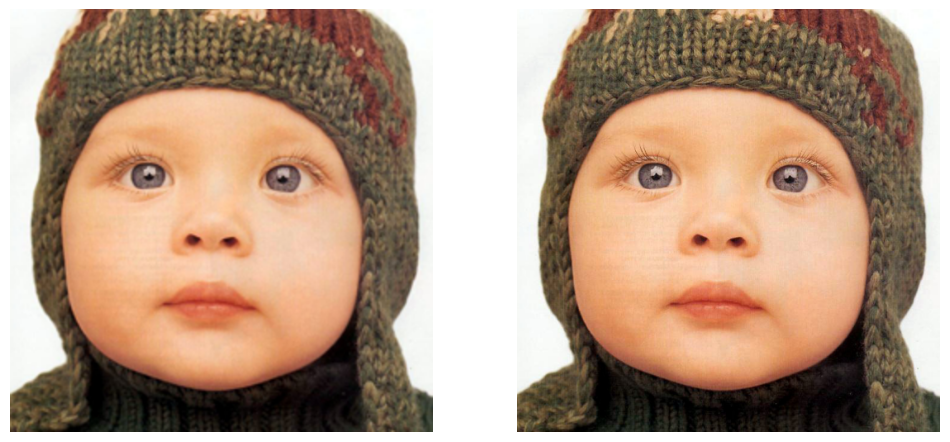

 14%|█▍        | 1/7 [00:00<00:02,  2.33it/s]

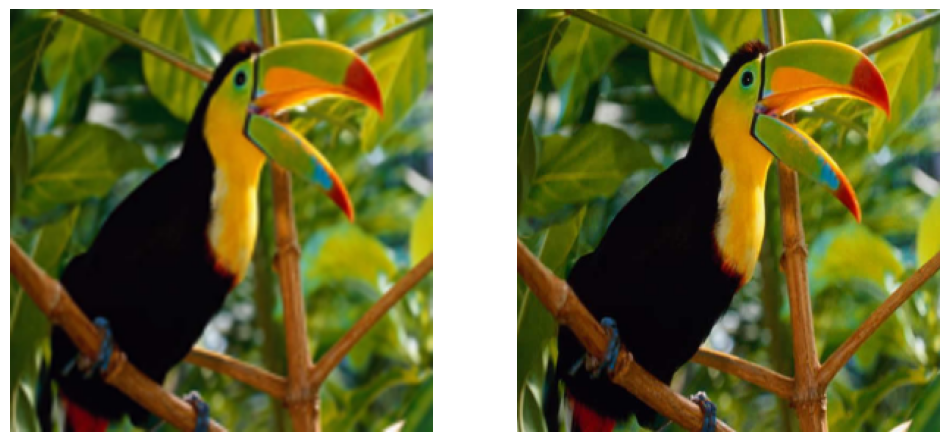

 29%|██▊       | 2/7 [00:00<00:01,  2.91it/s]

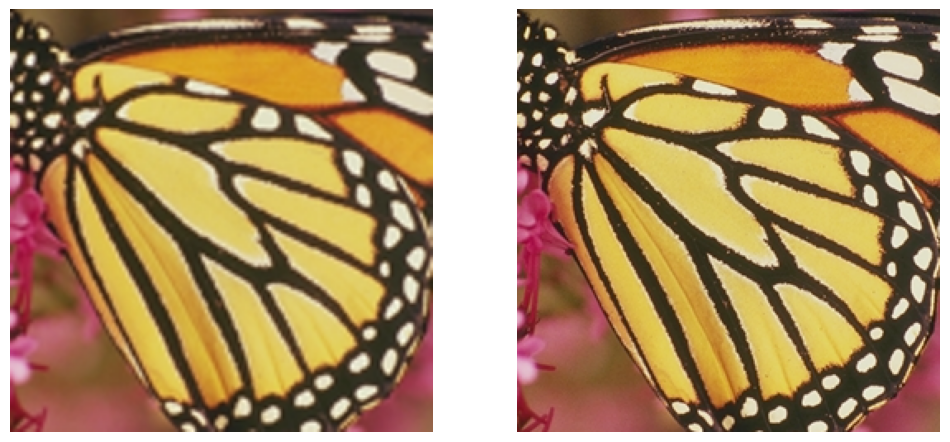

 43%|████▎     | 3/7 [00:00<00:01,  3.26it/s]

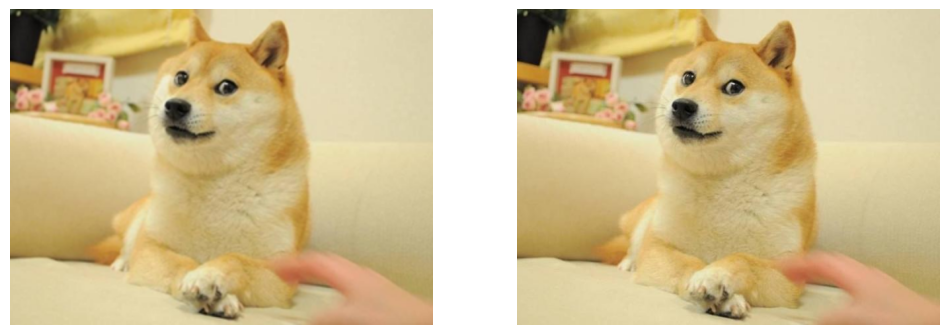

 57%|█████▋    | 4/7 [00:01<00:01,  2.94it/s]

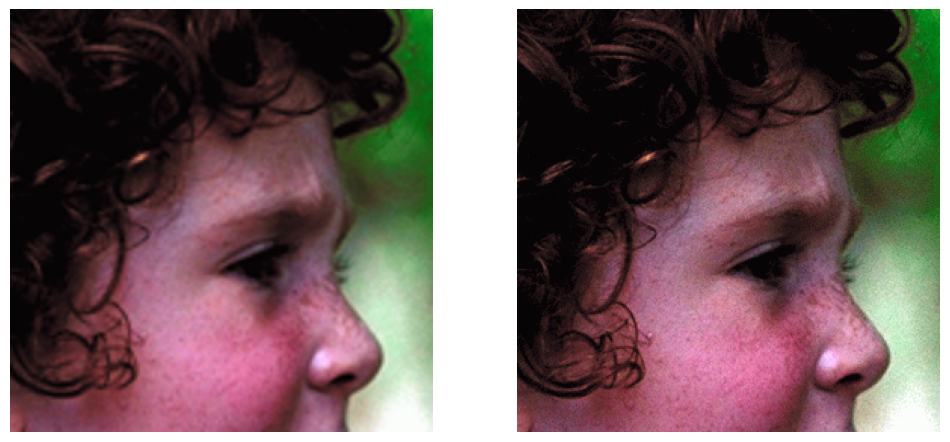

 71%|███████▏  | 5/7 [00:01<00:00,  3.44it/s]

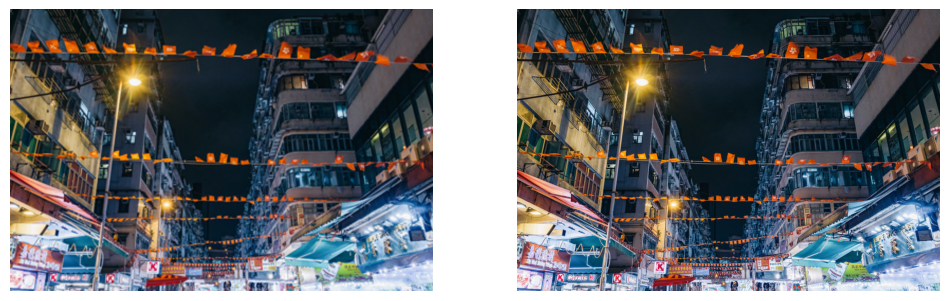

 86%|████████▌ | 6/7 [00:01<00:00,  3.78it/s]

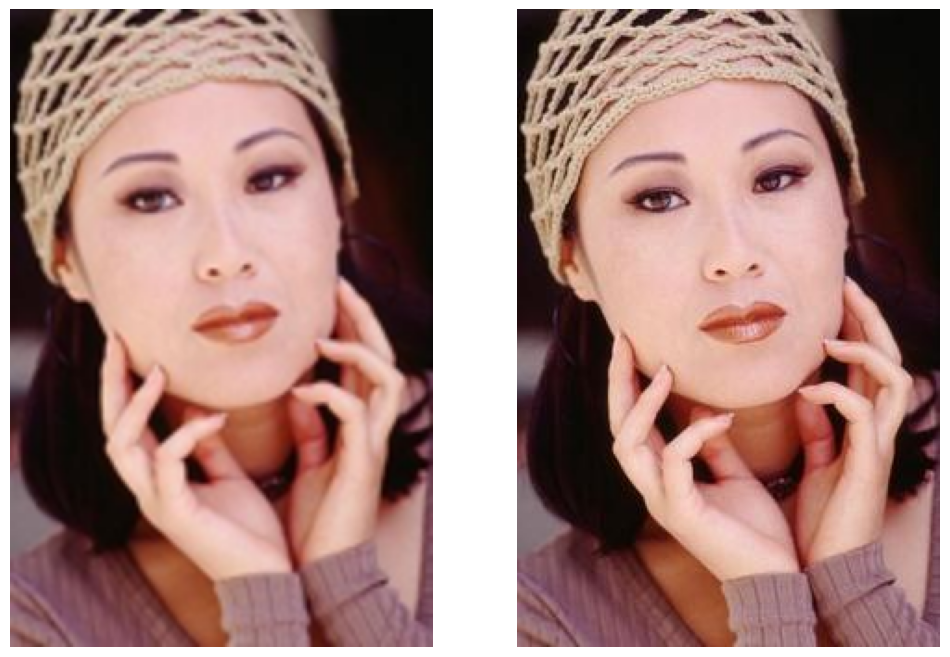

100%|██████████| 7/7 [00:02<00:00,  3.34it/s]


Test PSNR on Set5: 33.374


  0%|          | 0/14 [00:00<?, ?it/s]

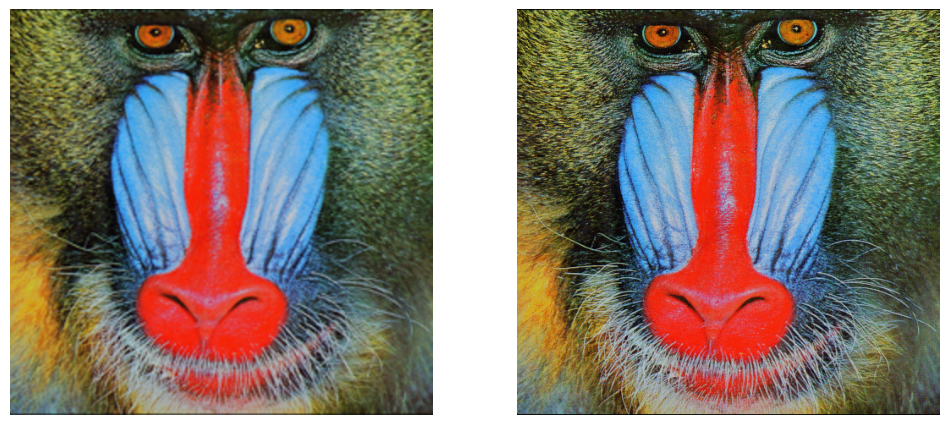

  7%|▋         | 1/14 [00:00<00:02,  4.54it/s]

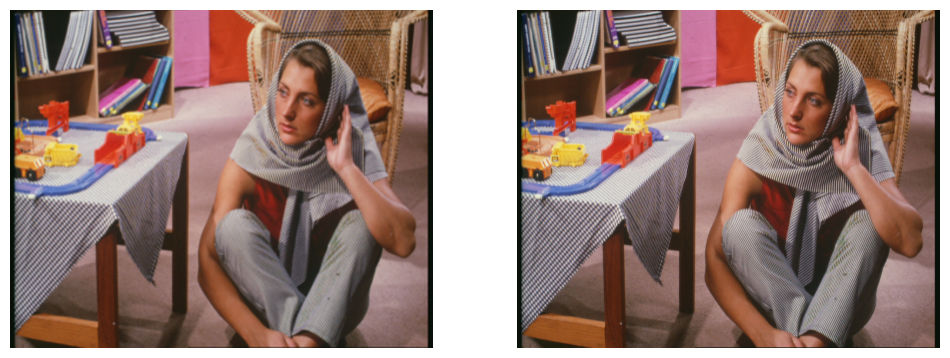

 14%|█▍        | 2/14 [00:00<00:02,  4.15it/s]

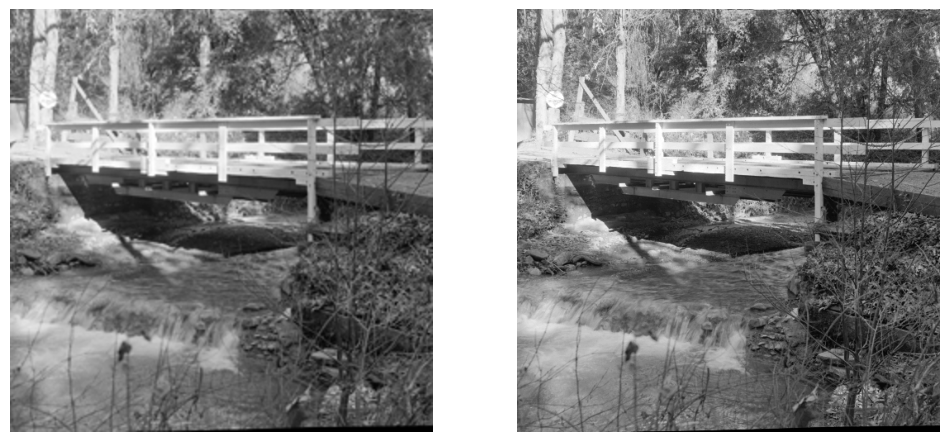

 21%|██▏       | 3/14 [00:00<00:02,  4.55it/s]

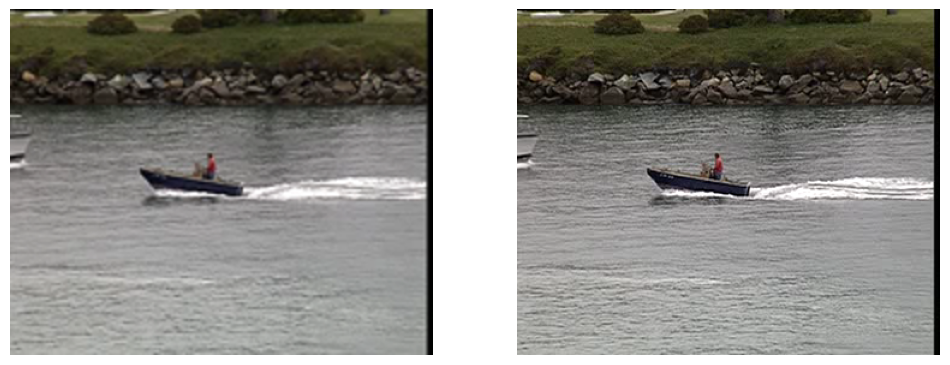

 29%|██▊       | 4/14 [00:00<00:01,  5.04it/s]

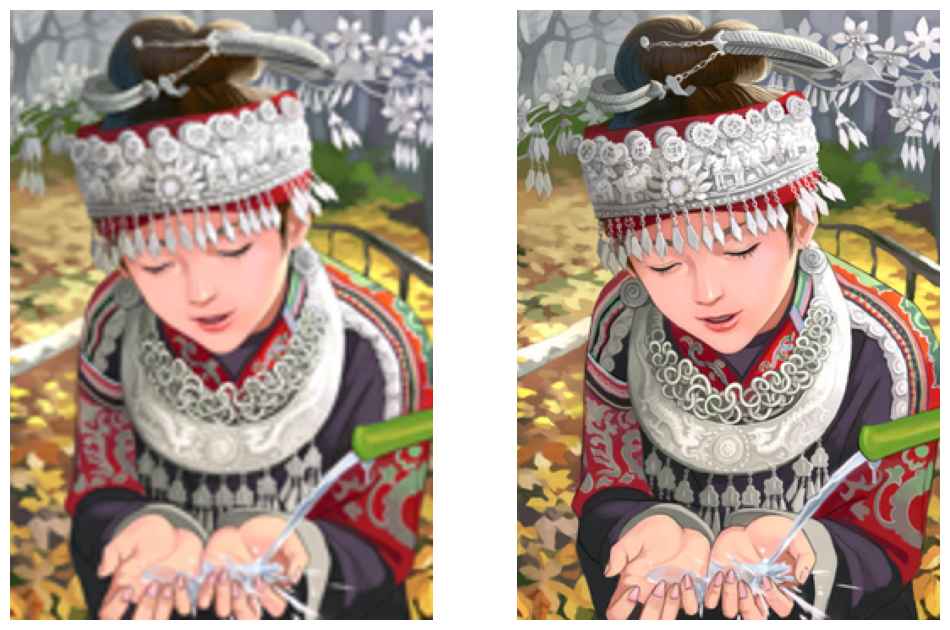

 36%|███▌      | 5/14 [00:01<00:02,  4.10it/s]

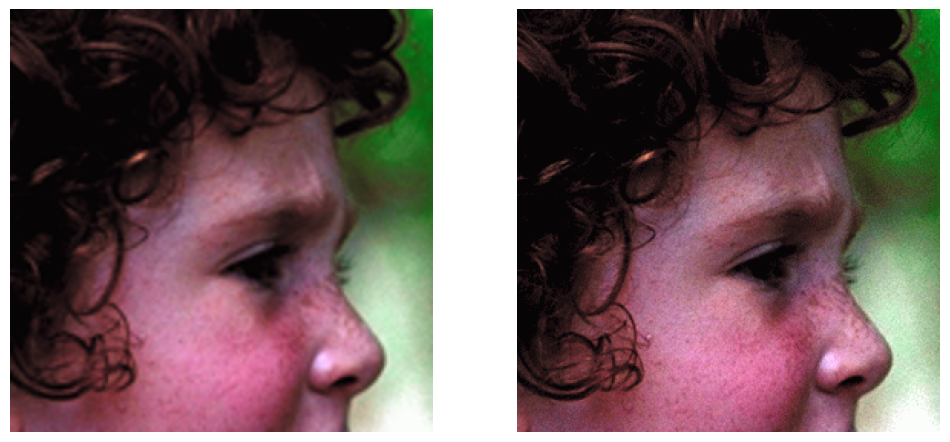

 43%|████▎     | 6/14 [00:01<00:01,  4.21it/s]

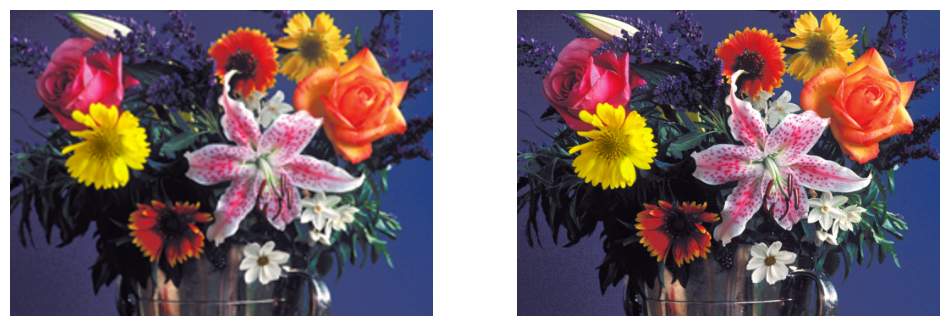

 50%|█████     | 7/14 [00:01<00:01,  4.25it/s]

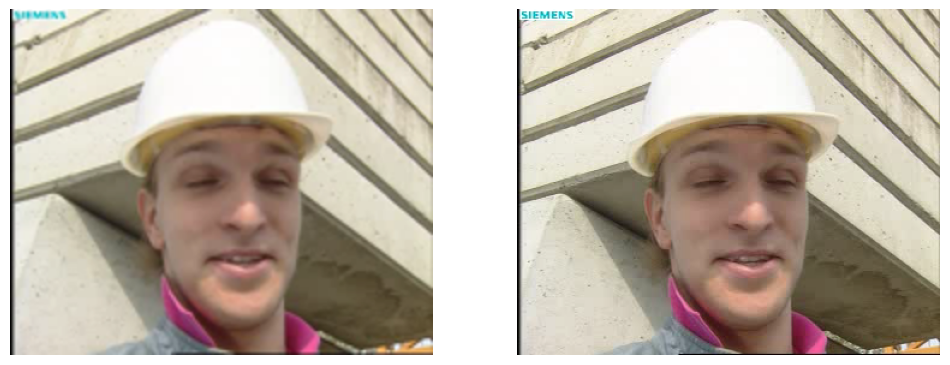

 57%|█████▋    | 8/14 [00:01<00:01,  4.45it/s]

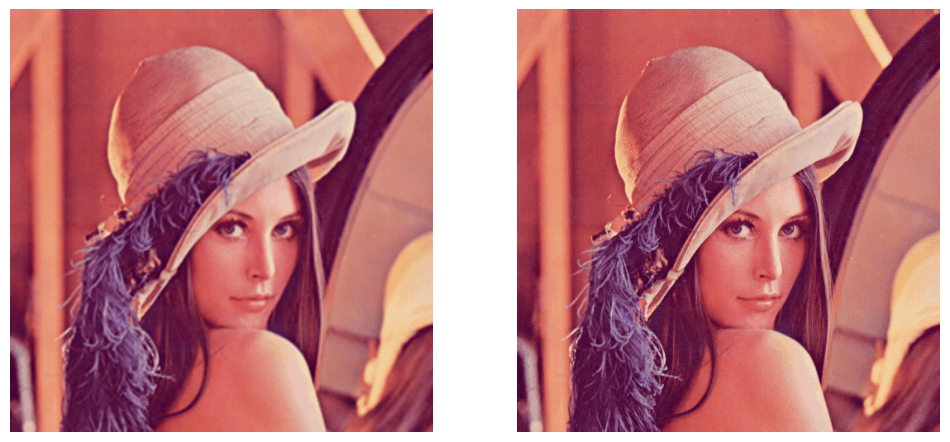

 64%|██████▍   | 9/14 [00:02<00:01,  3.81it/s]

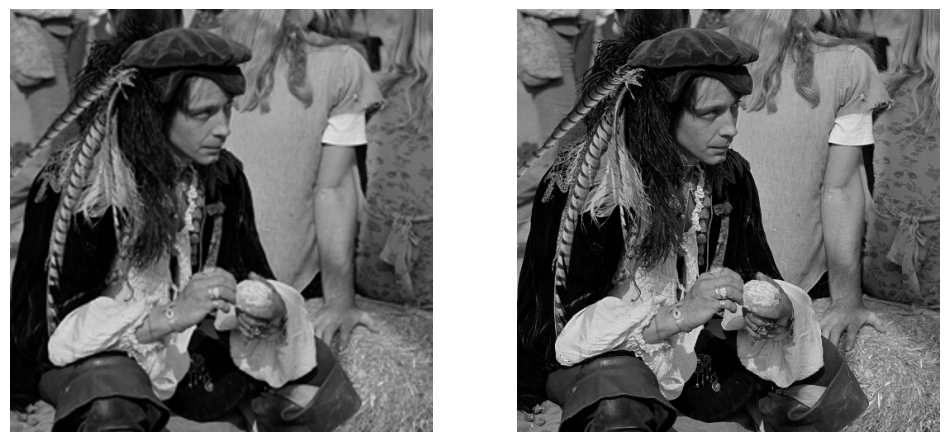

 71%|███████▏  | 10/14 [00:02<00:01,  3.44it/s]

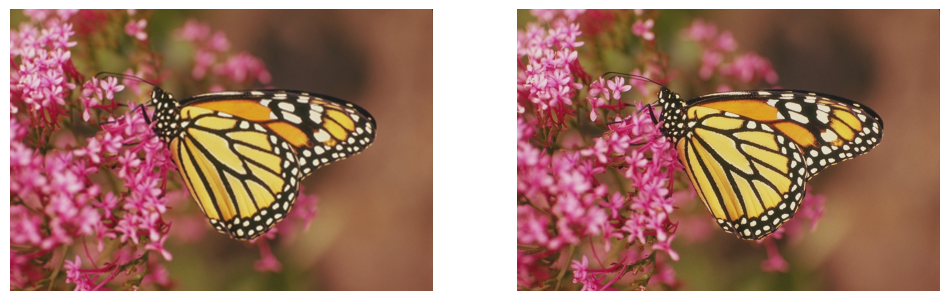

 79%|███████▊  | 11/14 [00:02<00:00,  3.44it/s]

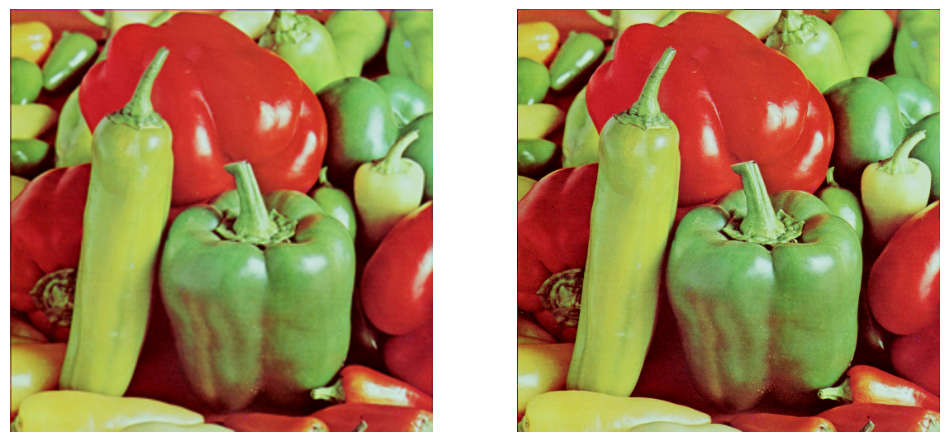

 86%|████████▌ | 12/14 [00:03<00:00,  3.25it/s]

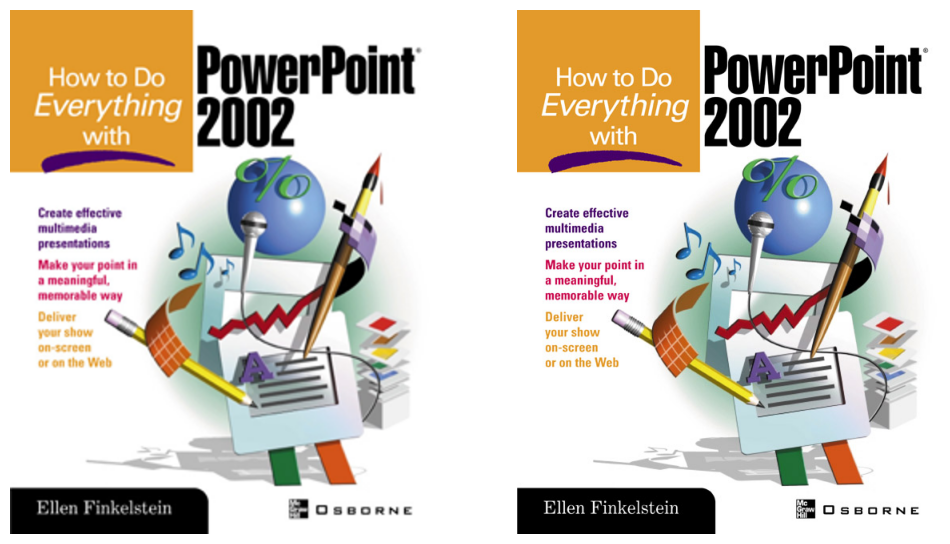

 93%|█████████▎| 13/14 [00:03<00:00,  3.39it/s]

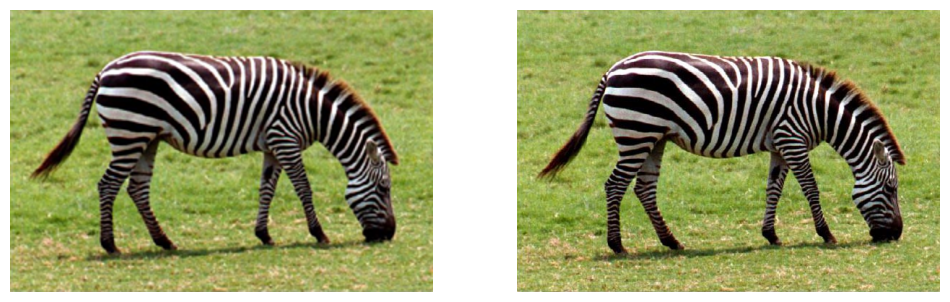

100%|██████████| 14/14 [00:03<00:00,  3.83it/s]

Test PSNR on Set14: 28.659


In [32]:
import torch
import glob as glob
import numpy as np
import matplotlib.pyplot as plt

from tqdm import tqdm
from srcnn import SRCNN
from PIL import Image
from utils import psnr
from torch.utils.data import DataLoader, Dataset


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def validate(model, dataloader, device):
    model.eval()
    running_loss = 0.0
    running_psnr = 0.0
    with torch.no_grad():
        for bi, data in tqdm(enumerate(dataloader), total=len(dataloader)):
            image_data = data[0].to(device)
            label = data[1].to(device)
            outputs = model(image_data)
            # Calculate batch psnr (once every `batch_size` iterations).
            batch_psnr = psnr(label, outputs)
            running_psnr += batch_psnr

    final_loss = running_loss/len(dataloader.dataset)
    final_psnr = running_psnr/len(dataloader)
    return final_loss, final_psnr

# The SRCNN dataset module.
class SRCNNDataset(Dataset):
    def __init__(self, image_paths):
        self.all_image_paths = glob.glob(f"{image_paths}/*")

    def __len__(self):
        return (len(self.all_image_paths))

    def __getitem__(self, index):
        # The high resolution ground truth label.
        label = Image.open(self.all_image_paths[index]).convert('RGB')
        w, h = label.size[:]
        # Convert to 2x bicubic.
        low_res_img = label.resize((int(w*0.5), int(h*0.5)), Image.BICUBIC)
        # The low resolution input image.
        image = low_res_img.resize((w, h), Image.BICUBIC)

        # Uncomment the below code to visualize the image for sanity check.
        plt.figure(figsize=(12, 9))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.axis('off')
        plt.subplot(1, 2, 2)
        plt.imshow(label)
        plt.axis('off')
        plt.show()

        image = np.array(image, dtype=np.float32)
        label = np.array(label, dtype=np.float32)

        image /= 255.
        label /= 255.

        image = image.transpose([2, 0, 1])
        label = label.transpose([2, 0, 1])

        return (
            torch.tensor(image, dtype=torch.float),
            torch.tensor(label, dtype=torch.float)
        )

# Prepare the datasets.
def get_datasets(
    image_paths
):
    dataset_test = SRCNNDataset(image_paths)
    return dataset_test

# Prepare the data loaders
def get_dataloaders(dataset_test):
    test_loader = DataLoader(
        dataset_test, 
        batch_size=1,
        shuffle=False
    )
    return test_loader


if __name__ == '__main__':
    # Load the model.
    model = SRCNN().to(device)
    model.load_state_dict(torch.load('../outputs/model.pth')) #

    data_paths = [
        ['../input/Set5/original', 'Set5'],
        ['../input/Set14/original', 'Set14']
    ]

    for data_path in data_paths:
        dataset_test = get_datasets(data_path[0])
        test_loader = get_dataloaders(dataset_test)

        _, test_psnr = validate(model, test_loader, device)
        print(f"Test PSNR on {data_path[1]}: {test_psnr:.3f}")

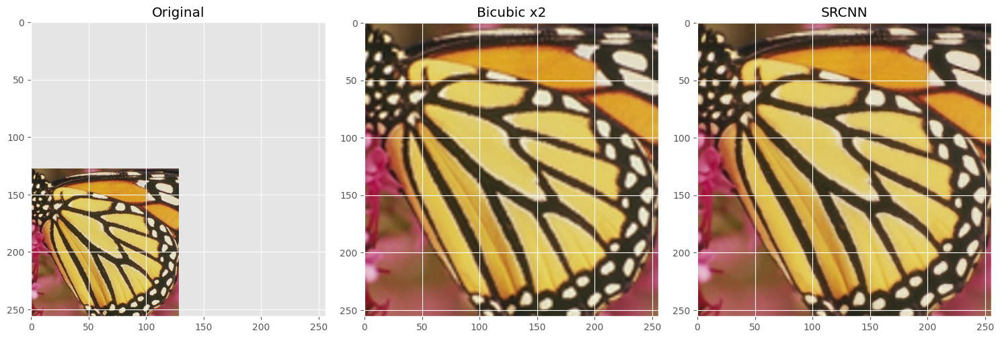

PSNR for SRCNN: 27.82


In [28]:
import torch
import torch.nn as nn
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def process_image(image_path, scale, device):
    original = Image.open(image_path).convert('RGB')
    downsampled = original.resize((original.width // scale, original.height // scale), Image.Resampling.BICUBIC)
    upscaled = downsampled.resize(original.size, Image.Resampling.BICUBIC)

    img_array = np.array(upscaled, dtype=np.float32) / 255.0
    img_tensor = torch.from_numpy(img_array.transpose(2, 0, 1)).unsqueeze(0).to(device)

    return original, downsampled, upscaled, img_tensor

def calculate_psnr(target, output):
    mse = np.mean((target - output) ** 2)
    return 20 * np.log10(1 / np.sqrt(mse))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = SRCNN().to(device)
ckpt = torch.load('../outputs/model_ckpt.pth')
model.load_state_dict(ckpt['model_state_dict'])
model.eval()


image_path = "D:/shallow_ml/20220606_SRCNN_Implementation_in_PyTorch_for_Image_Super_Resolution/input/butterfly.png"   #放入單一路徑 (準備去做超解析的影像)
scale = 2 ###選擇放大幾倍
orig, down, bicubic, input_tensor = process_image(image_path, scale, device)
output_tensor = model(input_tensor)
output_np = output_tensor.squeeze().cpu().detach().numpy().transpose(1, 2, 0)
output_np = np.clip(output_np, 0, 1)

#圖片調整
[w, h] = orig.size
# Calculate the small dimensions and the extent
small_width, small_height = w // scale, h // scale
# Set the extent for positioning the image at the top-right corner
extent = [0, w-small_width, h, h - small_height] #算圖片位置 ＃[left,right,top,bottom]

#圖呈現
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
axs[0].set_xlim([0, w])
axs[0].set_ylim([h, 0])
axs[0].set_title('Original')
axs[0].axis('on') #off
axs[0].imshow(orig, extent=extent)

axs[1].imshow(bicubic)
axs[1].set_title(f'Bicubic x{scale}')
axs[1].axis('on')

axs[2].imshow(output_np)
axs[2].set_title('SRCNN')
axs[2].axis('on')

plt.tight_layout()
plt.show()

#計算測試 psnr
psnr_value = calculate_psnr(np.array(orig) / 255.0, output_np)
print(f"PSNR for SRCNN: {psnr_value:.2f}")

